# A Multiplicative DRW Model for GRB Data

Let's start with the INTEGRAL data, which is not highly affected by dead time and saturation.

We need to implement a CARMA model

In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
import arviz as az

import numpy as np
import scipy.io

# Need both Jax and Tensorflow Probability 
import jax
# Important to enable 64-bit precision
jax.config.update("jax_enable_x64", True)

import jax.numpy as jnp
from jax import random
import tensorflow_probability.substrates.jax as tfp

# TinyGP for Gaussian Processes, JaxNS and numpyro for sampling
from tinygp import GaussianProcess, kernels
from tinygp.kernels.quasisep import CARMA
import corner

from jaxns.utils import resample
import numpyro
import numpyro.distributions as dist
from numpyro.infer.autoguide import AutoNormal, AutoIAFNormal
import numpyro.infer.autoguide as autoguide

#stingray imports
import stingray
from stingray import Lightcurve, Powerspectrum
from stingray.modeling.gpmodeling import get_kernel, get_mean
from stingray.modeling.gpmodeling import get_prior, get_log_likelihood, get_gp_params
from stingray.modeling.gpmodeling import _skew_gaussian

# suppress warnings
import warnings
warnings.filterwarnings("ignore")

# abbreviations for tensorflow distributions + bijectors
tfpd = tfp.distributions
tfpb = tfp.bijectors


INFO[2024-03-28 10:26:15,160]: Unable to initialize backend 'cuda': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
I0000 00:00:1711617975.160725       1 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.
INFO[2024-03-28 10:26:15,162]: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO[2024-03-28 10:26:15,167]: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: dlopen(libtpu.so, 0x0001): tried: 'libtpu.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OSlibtpu.so' (no such file), '/opt/miniconda3/envs/grbsearch/bin/../lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no such file, not in dyld cache), 'libtpu.so' (no such file), '/usr/local/lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no such file, not in dyld cache)
/Users/daniela/work/repositories/stingraysoftware/stingray/stingray/utils.py:35: UserWarning: pyfftw not installed. Using standard scipy fft
  warnings.warn(

## Latent GP Model with DRW + Numpyro, No Mean function

Let's generate some data:

200


INFO[2024-03-28 10:26:22,726]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-28 10:26:22,896]: Checking if light curve is sorted.


-99211.044338854


INFO[2024-03-28 10:26:22,982]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


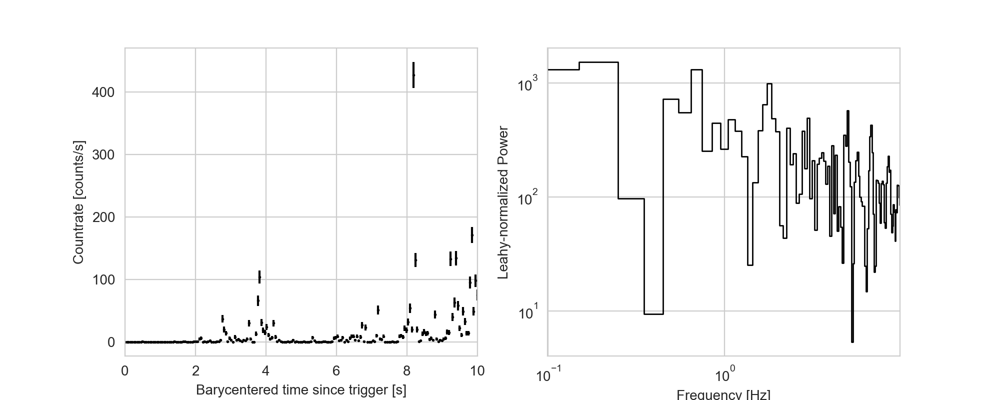

Text(0, 0.5, 'Leahy-normalized Power')

In [2]:
true_sigma = 3.0
true_scale = 0.5

kernel_params_true = {"sigma": true_sigma,
                      "scale": true_scale}

tseg = 10.0
time = np.linspace(0, tseg, int(tseg/0.05))
print(len(time))

#mean = np.ones_like(time)
true_mean = jnp.zeros_like(time)

kernel = kernels.quasisep.Exp(
    scale=true_scale, sigma=true_sigma
)

gp = GaussianProcess(kernel, time, diag=0.01)

key = random.PRNGKey(200)

# exponentiate GP
sample = np.exp(gp.sample(key))
# include Poisson uncertainties
sample = np.random.poisson(sample)


gp.condition(sample)
print(gp.log_probability(sample))
lcsample = Lightcurve(time, sample)
pssample = Powerspectrum(lcsample, norm="leahy")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
ax2.set_xlim(pssample.freq[0], pssample.freq[-1])
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Leahy-normalized Power")



Now we can define the model:

In [3]:
def no_mean_mult_model(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process, 
    and models the data as the exponential of that DRW process, 
    including Poisson uncertainties.
    
    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-10, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-2, 4))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Exp(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(jnp.exp(log_rate)), obs=y)


Now we can run MCMC and SVI on this to estimate the posterior, and compare results:

In [4]:
## MCMC 
nuts_kernel = numpyro.infer.NUTS(no_mean_mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=1000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(55873)
mcmc.run(rng_key, time, y=sample)
mcmc_samples = mcmc.get_samples()

sample: 100%|█| 2000/2000 [00:13<00:00, 150.67it/s, 31 steps of size 1.24e-01. a
sample: 100%|█| 2000/2000 [00:08<00:00, 225.08it/s, 31 steps of size 1.19e-01. a


<IPython.core.display.Javascript object>


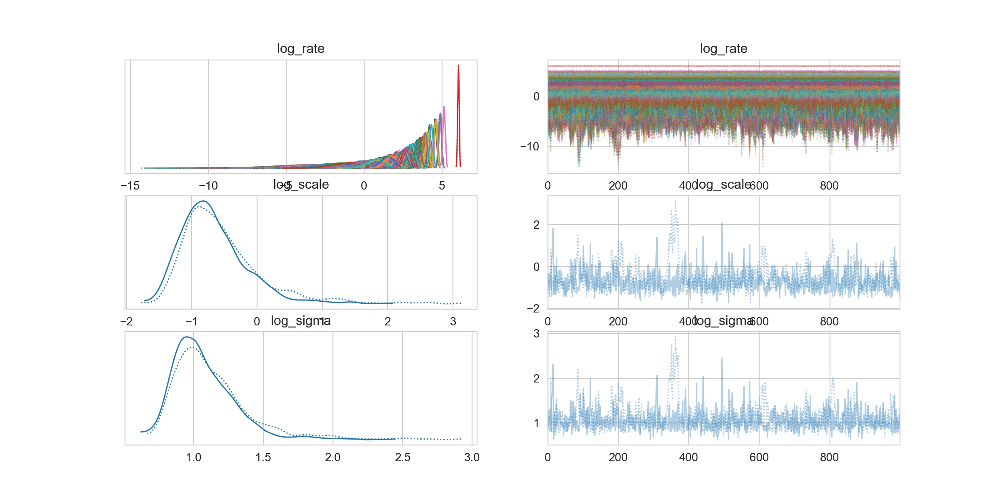

In [5]:
truths = [("log_scale", np.log(true_scale)), ("log_sigma", np.log(true_sigma))]

mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True, lines=truths);

Let's do SVI next:

In [6]:
# SVI
optim = numpyro.optim.Adam(0.001)
guide = autoguide.AutoMultivariateNormal(no_mean_mult_model)
#guide = AutoIAFNormal(const_mean_mult_model)
svi = numpyro.infer.SVI(no_mean_mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))

nsteps = 15000
results = svi.run(jax.random.PRNGKey(55873), nsteps, time, y=sample, progress_bar=True)


100%|█| 15000/15000 [01:28<00:00, 169.41it/s, init loss: 10253.7657, avg. loss [


<IPython.core.display.Javascript object>


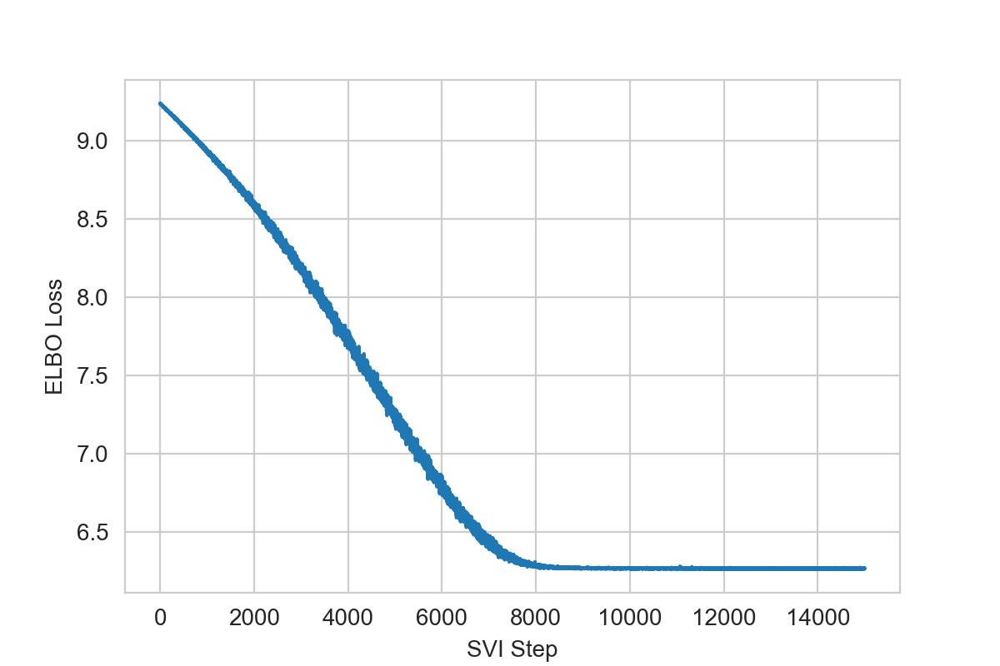

Text(0, 0.5, 'ELBO Loss')

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))

ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")



In [8]:
svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

<IPython.core.display.Javascript object>


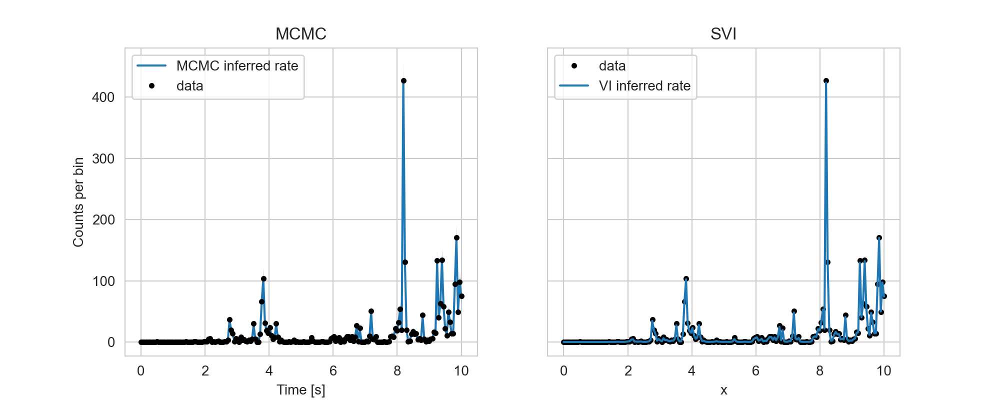

Text(0.5, 1.0, 'SVI')

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

q = np.percentile(mcmc_samples["log_rate"], [5, 25, 50, 75, 95], axis=0)
ax1.plot(lcsample.time, np.exp(q[2]), color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, np.exp(q[0]), np.exp(q[-1]), alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, np.exp(q[1]), np.exp(q[-2]), alpha=0.3, lw=0, color="C0")
#plt.plot(x, , "--", color="C1", label="true rate")
ax1.plot(lcsample.time, lcsample.counts, ".k", label="data")
ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")


mu = results.params["auto_loc"][2:] #results.params["log_rate_auto_loc"]
sigma = np.diag(results.params["auto_scale_tril"][2:])# results.params["log_rate_auto_scale"]
#ax2.errorbar(time, sample, yerr=np.sqrt(sample), 
#             markersize=3, color="black", label="data", alpha=0.3)
ax2.plot(lcsample.time, lcsample.counts, ".k", label="data")

ax2.plot(time, np.exp(mu), color="C0", label="VI inferred rate")
ax2.fill_between(
    time,
    np.exp(mu - 2 * sigma),
    np.exp(mu + 2 * sigma),
    alpha=0.3,
    lw=0,
    color="C0",
)
ax2.fill_between(time, np.exp(mu - sigma), np.exp(mu + sigma), alpha=0.8, lw=0, color="C0")
#plt.plot(time[:npoints], np.exp(true_log_rate), "--", color="C1", label="true rate")
ax2.legend(loc=2)
ax2.set_xlabel("x")
ax2.set_title("SVI")


In [10]:
#samples = guide.sample_posterior(random.PRNGKey(1), results.params, (1000,))
numpyro.diagnostics.print_summary(svi_samples, prob=0.89, group_by_chain=False)


                   mean       std    median      5.5%     94.5%     n_eff     r_hat
  log_rate[0]     -3.20      1.53     -3.19     -5.57     -0.85    871.73      1.00
  log_rate[1]     -3.35      1.42     -3.40     -5.48     -0.99    960.40      1.00
  log_rate[2]     -3.45      1.39     -3.47     -5.61     -1.25    887.05      1.00
  log_rate[3]     -3.50      1.38     -3.50     -5.49     -1.21    896.26      1.00
  log_rate[4]     -3.44      1.43     -3.49     -5.49     -0.89    904.52      1.00
  log_rate[5]     -3.38      1.40     -3.38     -5.57     -1.09    821.18      1.00
  log_rate[6]     -3.31      1.36     -3.35     -5.47     -1.21    873.52      1.00
  log_rate[7]     -3.19      1.29     -3.20     -5.21     -1.18    886.22      1.00
  log_rate[8]     -2.89      1.28     -2.90     -4.88     -0.83    727.85      1.00
  log_rate[9]     -2.53      1.20     -2.51     -4.41     -0.63    863.45      1.00
 log_rate[10]     -1.86      1.17     -1.84     -4.14     -0.34    965.05  

<IPython.core.display.Javascript object>


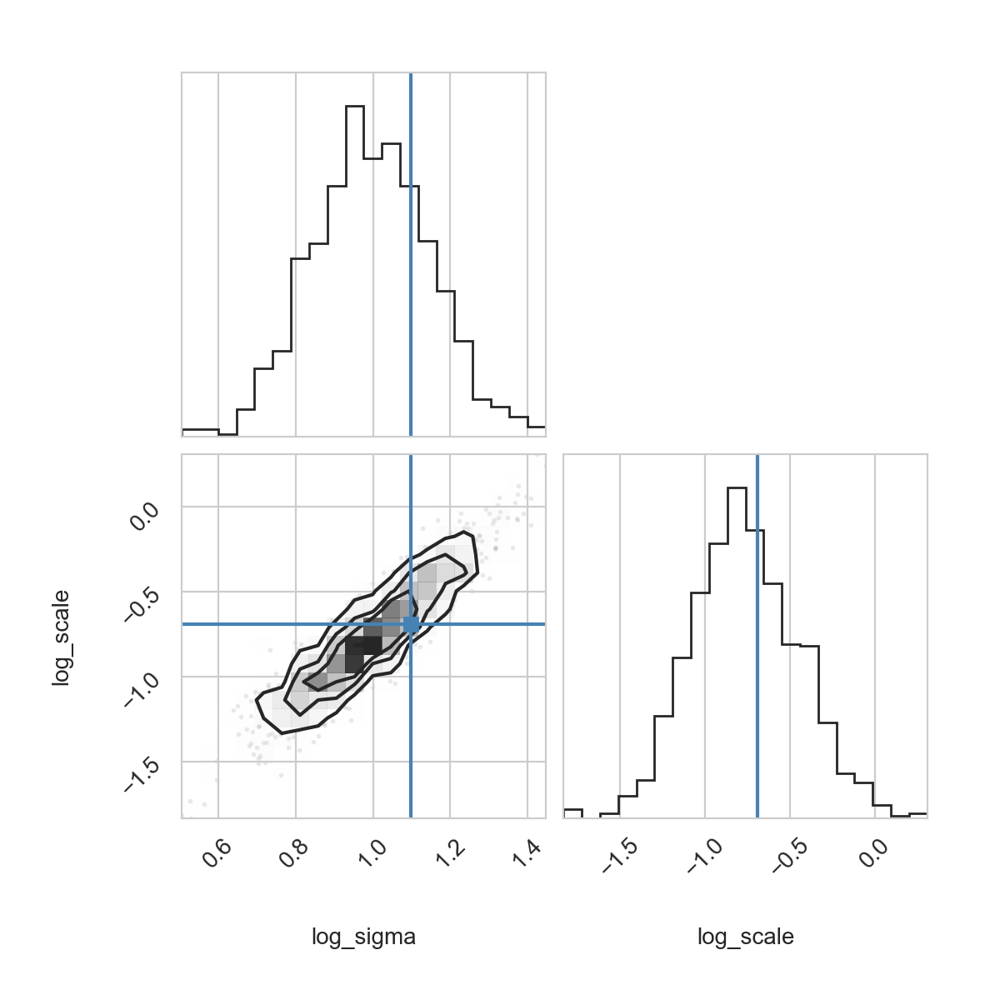

In [11]:
var_names = ["log_sigma", "log_scale"]
true_params = {"log_sigma": jnp.log(true_sigma), "log_scale": jnp.log(true_scale)}

samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])

# SVI Samples
fig = plt.figure(figsize=(6, 6))
corner.corner(samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="SVI");


<IPython.core.display.Javascript object>


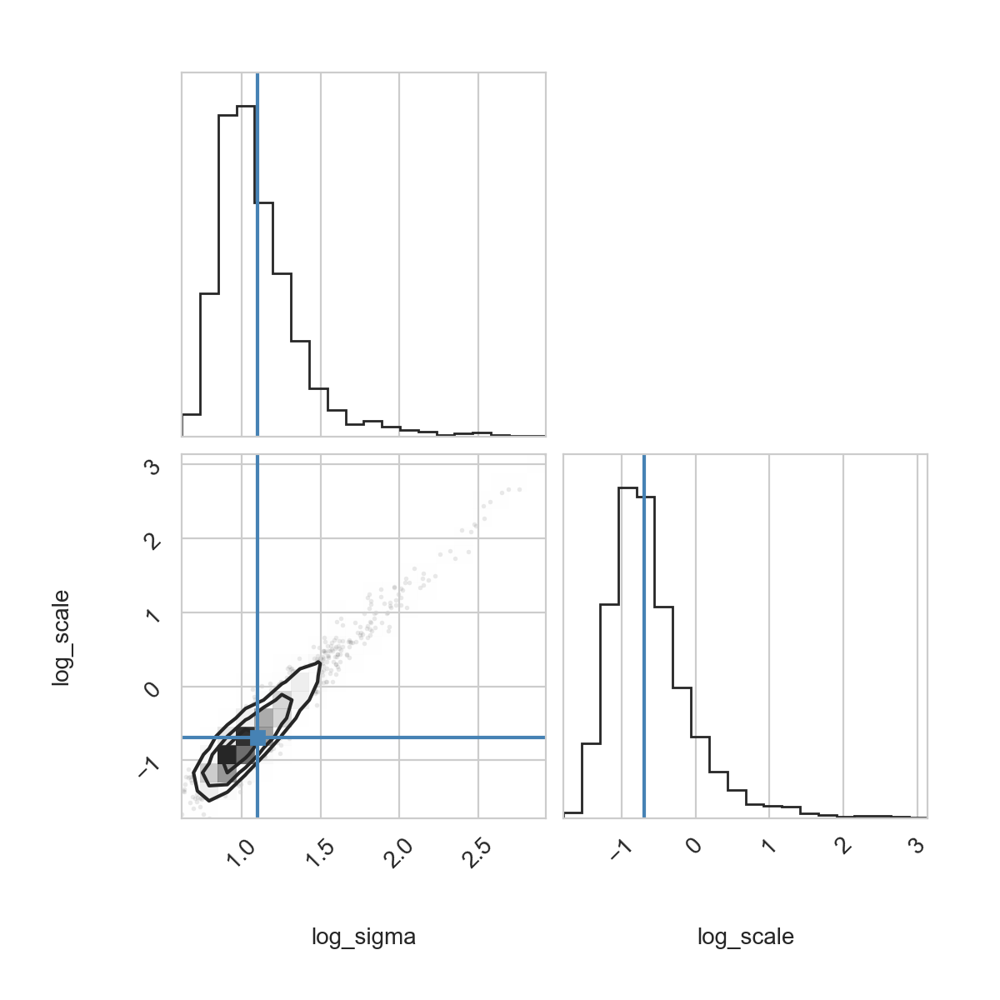

In [12]:
# MCMC Samples
fig = plt.figure(figsize=(6, 6))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");

### Including an additive, constant mean function:

400


INFO[2024-03-28 10:41:52,302]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-28 10:41:52,303]: Checking if light curve is sorted.
INFO[2024-03-28 10:41:52,304]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


-154631.3409861472


<IPython.core.display.Javascript object>


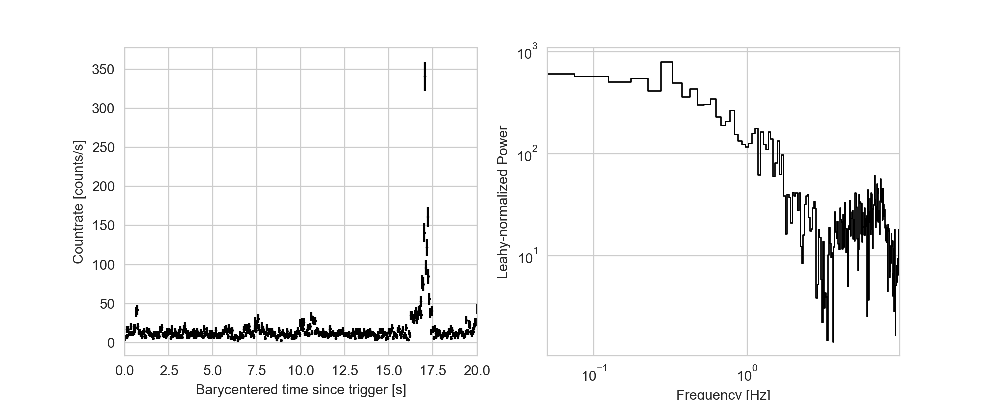

Text(0, 0.5, 'Leahy-normalized Power')

In [13]:
true_sigma = 2.0
true_scale = 1.0

kernel_params_true = {"sigma": true_sigma,
                      "scale": true_scale}

tseg = 20.0
time = np.linspace(0, tseg, int(tseg/0.05))
print(len(time))

#mean = np.ones_like(time)
true_const = 10.0
mean = jnp.zeros_like(time) + true_const

kernel = kernels.quasisep.Exp(
    scale=true_scale, sigma=true_sigma
)

gp = GaussianProcess(kernel, time, diag=0.01)

key = random.PRNGKey(500)

# exponentiate GP
sample = np.exp(gp.sample(key))
# include Poisson uncertainties
sample = np.random.poisson(sample + mean)


gp.condition(sample)
print(gp.log_probability(sample))
lcsample = Lightcurve(time, sample)
pssample = Powerspectrum(lcsample, norm="leahy")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
ax2.set_xlim(pssample.freq[0], pssample.freq[-1])
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Leahy-normalized Power")


In [16]:
def const_mean_mult_model(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process, 
    and models the data as the exponential of that DRW process, 
    including Poisson uncertainties.
    
    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-10, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-2, 4))
    log_const = numpyro.sample("log_const", dist.Uniform(-2, 5))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Exp(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    flux = jnp.exp(log_rate) + jnp.exp(log_const)

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


In [17]:
## MCMC 
nuts_kernel = numpyro.infer.NUTS(const_mean_mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=1000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(55873)
mcmc.run(rng_key, time, y=sample)
mcmc_samples = mcmc.get_samples()


sample: 100%|█| 2000/2000 [00:26<00:00, 75.60it/s, 127 steps of size 8.37e-02. a
sample: 100%|█| 2000/2000 [00:23<00:00, 86.17it/s, 63 steps of size 8.13e-02. ac


<IPython.core.display.Javascript object>


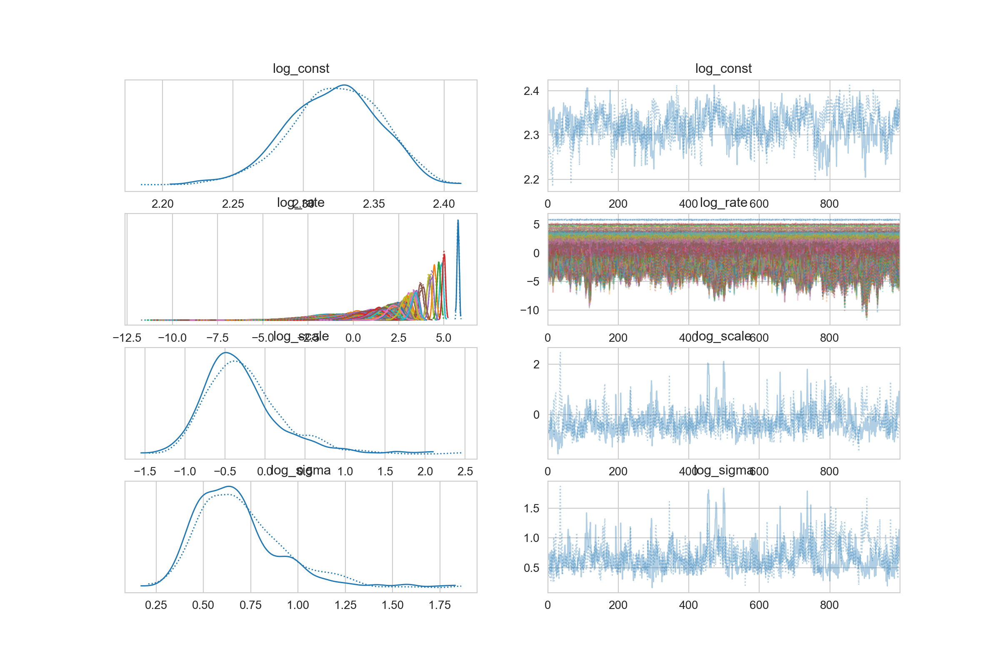

In [18]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

In [19]:
# SVI
optim = numpyro.optim.Adam(0.0005)
guide = autoguide.AutoMultivariateNormal(const_mean_mult_model)
#guide = AutoIAFNormal(const_mean_mult_model)
svi = numpyro.infer.SVI(const_mean_mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))
nsteps = 20000
results = svi.run(jax.random.PRNGKey(55973), 20000, time, y=sample, progress_bar=True)

svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

100%|█| 20000/20000 [04:20<00:00, 76.73it/s, init loss: 30984.4064, avg. loss [1


<IPython.core.display.Javascript object>


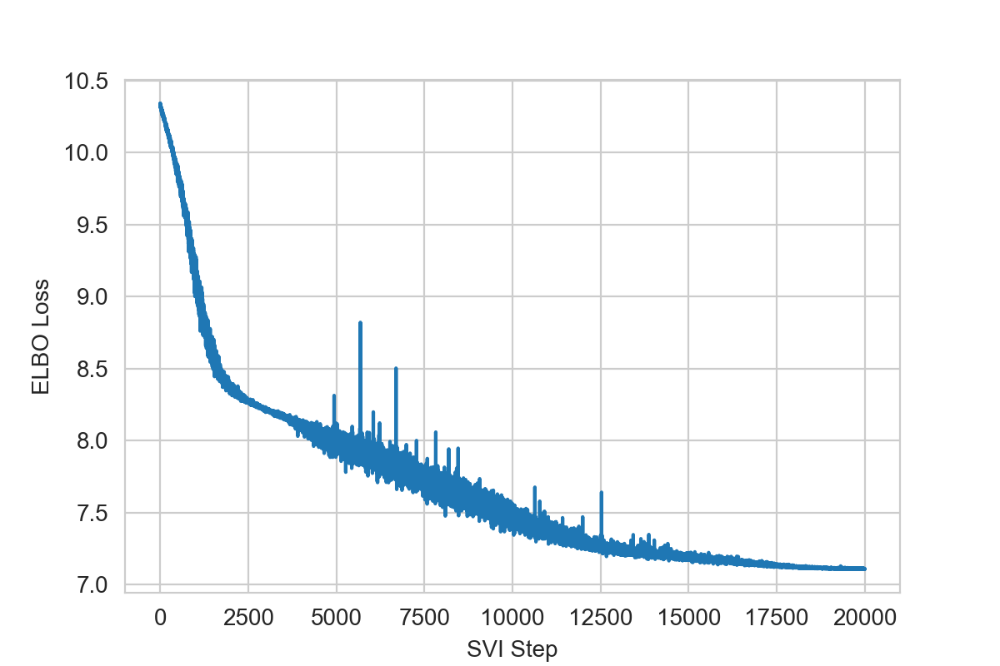

Text(0, 0.5, 'ELBO Loss')

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")



Let's plot posterior predictives to see how well the model fits the data:

<IPython.core.display.Javascript object>


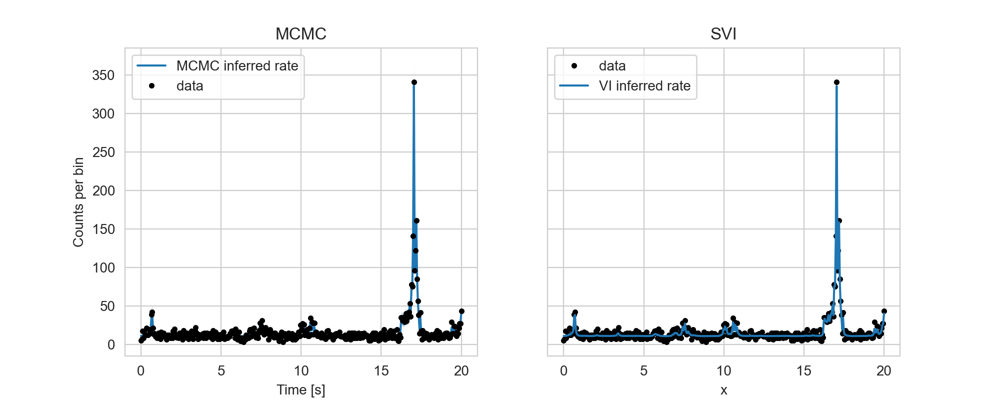

Text(0.5, 1.0, 'SVI')

In [21]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

mcmc_flux = jnp.exp(mcmc_samples["log_rate"]).T + jnp.exp(mcmc_samples["log_const"])
q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.plot(lcsample.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")
#plt.plot(x, , "--", color="C1", label="true rate")
ax1.plot(lcsample.time, lcsample.counts, ".k", label="data")
ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")


mu = results.params["auto_loc"][3:] #results.params["log_rate_auto_loc"]
sigma = np.diag(results.params["auto_scale_tril"][3:])# results.params["log_rate_auto_scale"]
#ax2.errorbar(time, sample, yerr=np.sqrt(sample), 
#             markersize=3, color="black", label="data", alpha=0.3)
ax2.plot(lcsample.time, lcsample.counts, ".k", label="data")

ax2.plot(time, np.exp(mu) + np.exp(np.median(svi_samples["log_const"])), color="C0", label="VI inferred rate")
ax2.fill_between(
    time,
    np.exp(mu - 2 * sigma) + np.exp(np.median(svi_samples["log_const"])),
    np.exp(mu + 2 * sigma) + np.exp(np.median(svi_samples["log_const"])),
    alpha=0.3,
    lw=0,
    color="C0",
)
ax2.fill_between(time, 
                 np.exp(mu - sigma) + np.exp(np.median(svi_samples["log_const"])), 
                 np.exp(mu + sigma) + np.exp(np.median(svi_samples["log_const"])), alpha=0.8, lw=0, color="C0")
#plt.plot(time[:npoints], np.exp(true_log_rate), "--", color="C1", label="true rate")
ax2.legend(loc=2)
ax2.set_xlabel("x")
ax2.set_title("SVI")


Plot MCMC Results:

<IPython.core.display.Javascript object>


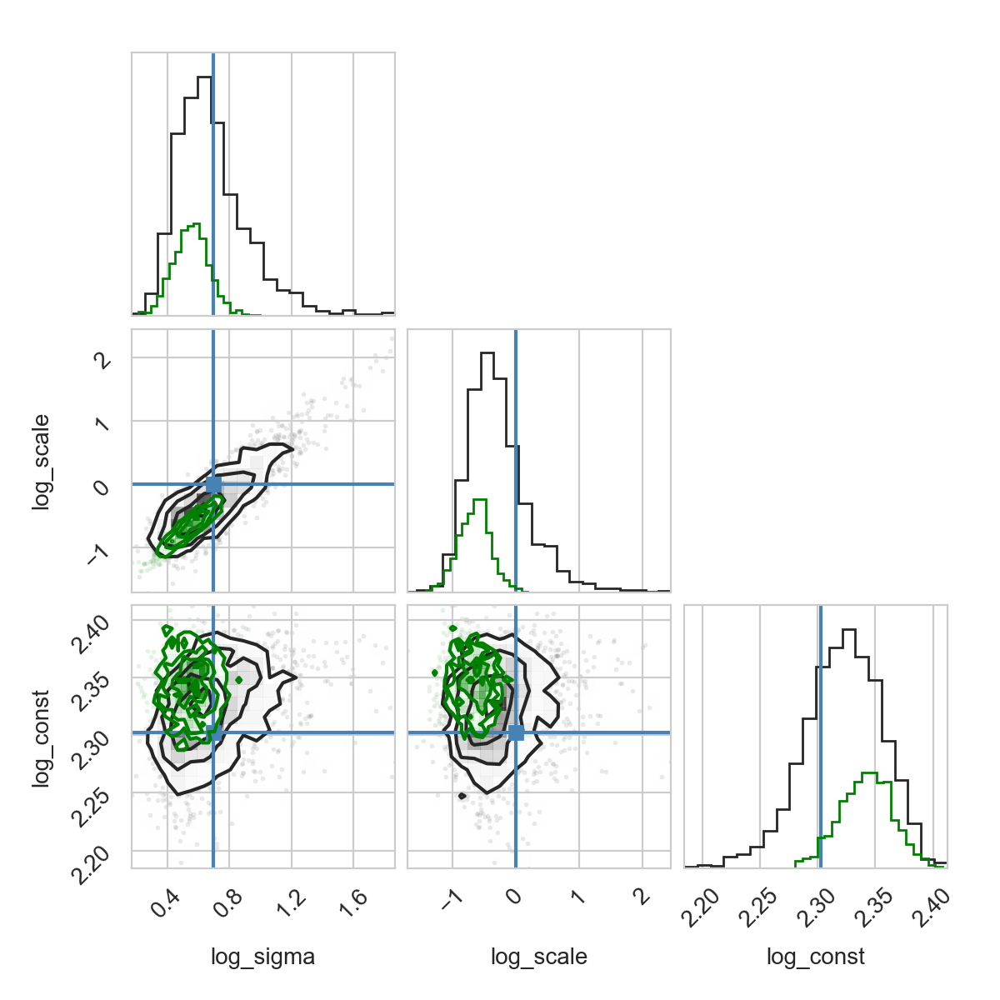

<IPython.core.display.Javascript object>


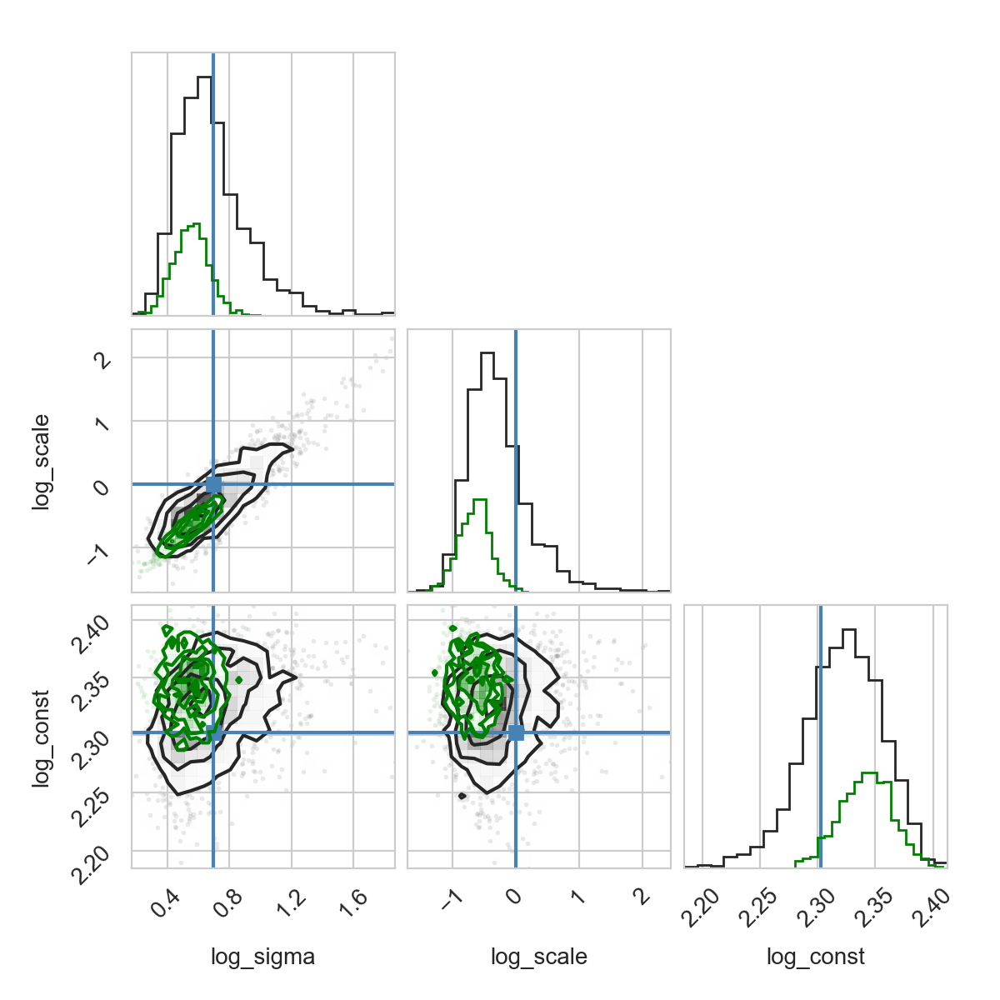

In [22]:
var_names = ["log_sigma", "log_scale", "log_const"]
true_params = {"log_sigma": jnp.log(true_sigma), "log_scale": jnp.log(true_scale),
               "log_const": jnp.log(true_const)}

samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(6, 6))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, fig=fig, color="green")

Good enough. Time for a more complex mean function:

### Including an Additive Mean Function

Let's now include a additive mean function before we do the same with the multiplicative version.

In [23]:
def power_spectrum(freq, sigma, ar_coef, ma_coefs=[1.0]):
    """
    FROM CARMApack (Kelly et al, 2014)
    
    Return the power spectrum for a CARMA(p,q) process calculated at the input frequencies.

    :param freq: The frequencies at which to calculate the PSD.
    :param sigma: The standard deviation driving white noise.
    :param ar_coef: The CARMA model autoregressive coefficients.
    :param ma_coefs: Coefficients of the moving average polynomial

    :rtype : The power spectrum at the input frequencies, a numpy array.
    """
    try:
        len(ma_coefs) <= len(ar_coef)
    except ValueError:
        "Size of ma_coefs must be less or equal to size of ar_roots."

    ma_poly = np.polyval(ma_coefs[::-1], 2.0 * np.pi * 1j * freq)  # Evaluate the polynomial in the PSD numerator
    ar_poly = np.polyval(ar_coef, 2.0 * np.pi * 1j * freq)  # Evaluate the polynomial in the PSD denominator
    pspec = sigma ** 2 * np.abs(ma_poly) ** 2 / np.abs(ar_poly) ** 2
    return pspec

In [24]:
def skewgaussian(t, params):
    #parameter_names = ("logA", "t0", "logsig1", "logsig2")
    logA = params[0]
    t0 = params[1]
    logsig1 = params[2]
    logsig2 = params[3]

    y = jnp.exp(logA) * jnp.where(
            t > t0,
            jnp.exp(-((t - t0) ** 2) / (2 * (jnp.exp(logsig2)**2))),
            jnp.exp(-((t - t0) ** 2) / (2 * (jnp.exp(logsig1)**2))),
        )
    return y

INFO[2024-03-28 16:48:55,827]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-28 16:48:55,828]: Checking if light curve is sorted.
INFO[2024-03-28 16:48:55,829]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


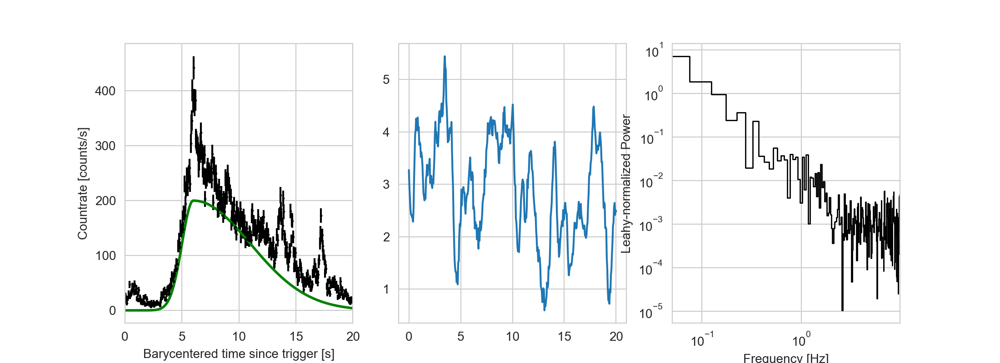

In [72]:
# Make a time array
dt = 0.05
tseg = 20.0
time = np.linspace(0, tseg, int(tseg/0.05))


# set up GP kernel
true_sigma = 1.0
true_scale = 0.5

kernel_params_true = {"sigma": true_sigma,
                      "scale": true_scale}

kernel = kernels.quasisep.Matern32(scale=true_scale, sigma=true_sigma)

# GP without the mean function to generate random process
gp = GaussianProcess(kernel, time, diag=0.01)

# generate GP realization
key = random.PRNGKey(120)
gp_sample = gp.sample(key)

# calculate background mean
true_const = 10.0
bkg = jnp.zeros_like(time) + true_const


# set up the mean function
skew_amp = 200
skew_t0 = 6.0
skew_sig1 = 1.0
skew_sig2 = 5.0

mean_params_true = [np.log(skew_amp),
               skew_t0,
               np.log(skew_sig1),
               np.log(skew_sig2),]

mean_val = skewgaussian(time, mean_params_true)


# calculate flux
exp_const = 3.0 # constant to add to exponential
exp_gp = jnp.exp(gp_sample + exp_const) # exponentiated GP
flux = exp_gp + mean_val #+ bkg # add mean function and bkg
counts = np.random.poisson(flux)

lcsample = Lightcurve(time, counts)
pssample = Powerspectrum(lcsample, norm="frac")

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(11,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
ax1.plot(time, mean_val, lw=2, color="green")

ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.plot(lcsample.time, sample)
#ps_carma = power_spectrum(pssample.freq, sigma, alpha, beta)

ax3.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
#ax2.loglog(pssample.freq, ps_carma, lw=1, color="purple")
ax3.set_xlim(pssample.freq[0], pssample.freq[-1])
ax3.set_xlabel("Frequency [Hz]")
ax3.set_ylabel("Leahy-normalized Power")


def plot_kernel(kernel, **kwargs):
    dx = np.linspace(0, 5, 100)
    plt.figure()
    plt.plot(dx, kernel(dx, dx[:1]), **kwargs)
    plt.xlabel("dx")
    plt.ylabel("k(dx)")


#plot_kernel(kernel)

Now we can define the model:

In [77]:
def add_mean_mult_model(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process, 
    and models the data as the exponential of that DRW process, 
    including Poisson uncertainties.
    
    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # mean parameters
    log_amp = numpyro.sample('log_amp', dist.Uniform(3, 8))
    t0 = numpyro.sample("t0", dist.Uniform(2, 10))
    log_sig1 = numpyro.sample("log_sig1", dist.Uniform(-1, 1.5))
    log_sig2 = numpyro.sample("log_sig2", dist.Uniform(0, 3))
    #log_const = numpyro.sample("log_const", dist.Uniform(-1, 5))

    mean_params = [log_amp, t0, log_sig1, log_sig2]
    
    mean_val = skewgaussian(x, mean_params)
    

    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-2, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-2, 4))
    #log_const = numpyro.sample("log_const", dist.Uniform(-2, 5))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Matern32(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    flux = jnp.exp(log_rate + 3.0) + mean_val

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


Sampling, first with MCMC, then with SVI:

In [82]:
## MCMC 
nuts_kernel = numpyro.infer.NUTS(add_mean_mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=1000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(55889)
mcmc.run(rng_key, lcsample.time, y=lcsample.counts)
mcmc_samples = mcmc.get_samples()


sample: 100%|█| 2000/2000 [00:58<00:00, 34.00it/s, 127 steps of size 3.57e-02. a
sample: 100%|█| 2000/2000 [00:59<00:00, 33.90it/s, 63 steps of size 3.65e-02. ac


<IPython.core.display.Javascript object>


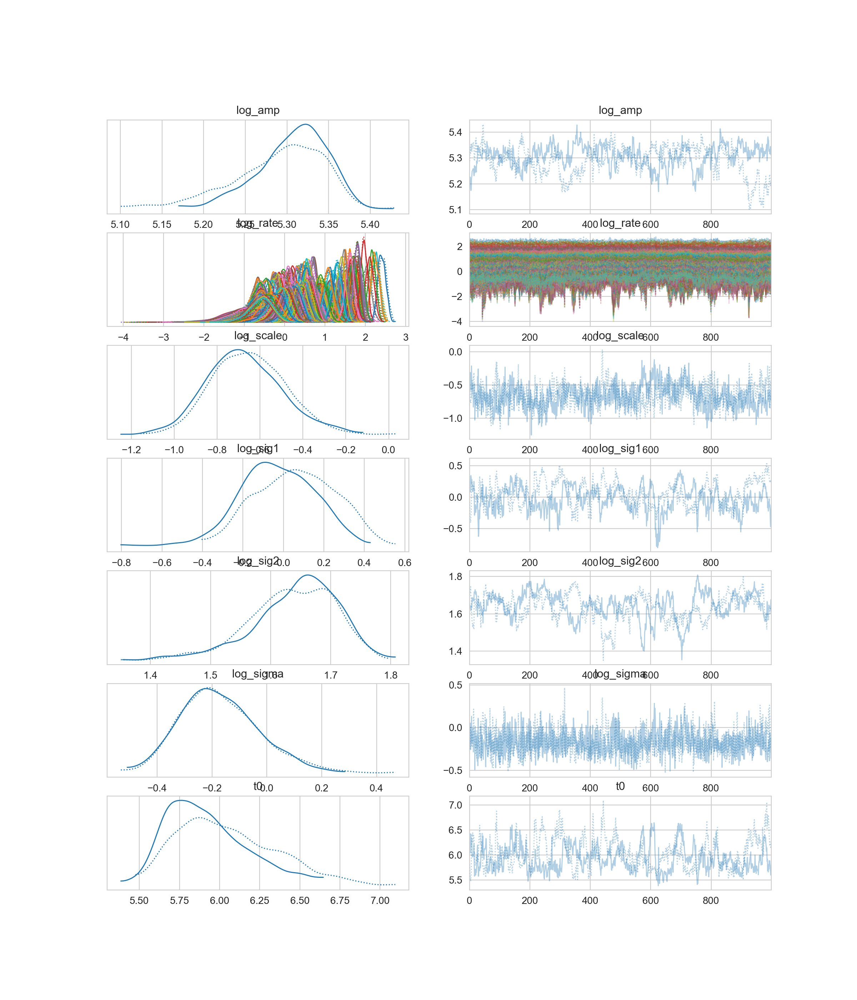

In [83]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

SVI, this time with initialization from relatively close values:

In [84]:
from numpyro.infer import init_to_value
init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
               "log_sigma": 1.0, "log_scale":0.5}

In [85]:
# SVI
optim = numpyro.optim.Adam(0.001)
#guide = autoguide.AutoMultivariateNormal(add_mean_mult_model)
guide = autoguide.AutoDAIS(add_mean_mult_model, init_loc_fn=init_to_value(values=init_values))
svi = numpyro.infer.SVI(add_mean_mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))

nsteps = 10000
results = svi.run(jax.random.PRNGKey(55873), nsteps, lcsample.time, y=lcsample.counts, progress_bar=True)

svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

100%|█| 10000/10000 [06:50<00:00, 24.39it/s, init loss: 20709.0211, avg. loss [9


Plotting the loss function:

<IPython.core.display.Javascript object>


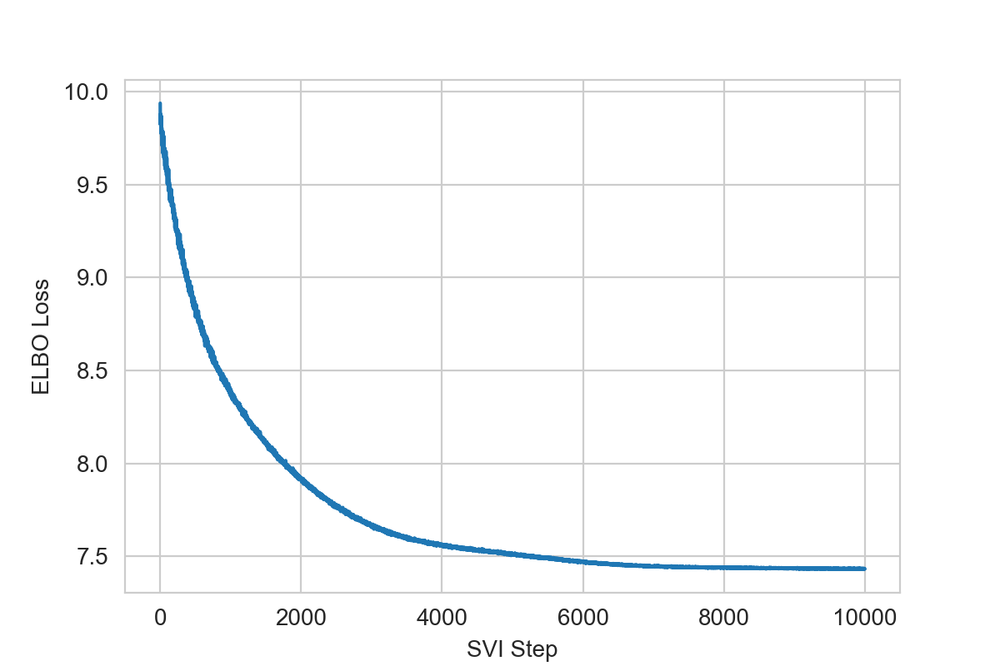

Text(0, 0.5, 'ELBO Loss')

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")

What do the results look like?

In [87]:
mcmc_skew_params = np.array([mcmc_samples["log_amp"], mcmc_samples["t0"], 
                    mcmc_samples["log_sig1"], mcmc_samples["log_sig2"]]).T

mcmc_mean = []
for p in mcmc_skew_params:
    mcmc_mean.append(skewgaussian(lcsample.time,p))

mcmc_mean = np.array(mcmc_mean)

#svi_median_params = np.array([jnp.median(svi_samples["log_amp"]),
#                     jnp.median(svi_samples["t0"]), 
#                     jnp.median(svi_samples["log_sig1"]), 
#                     jnp.median(svi_samples["log_sig2"])])

#svi_mean = skewgaussian(lcsample.time, svi_median_params)

svi_skew_params = np.array([svi_samples["log_amp"], svi_samples["t0"], 
                            svi_samples["log_sig1"], svi_samples["log_sig2"]]).T

svi_mean = []
for p in svi_skew_params:
    svi_mean.append(skewgaussian(lcsample.time,p))

svi_mean = np.array(svi_mean)

<IPython.core.display.Javascript object>


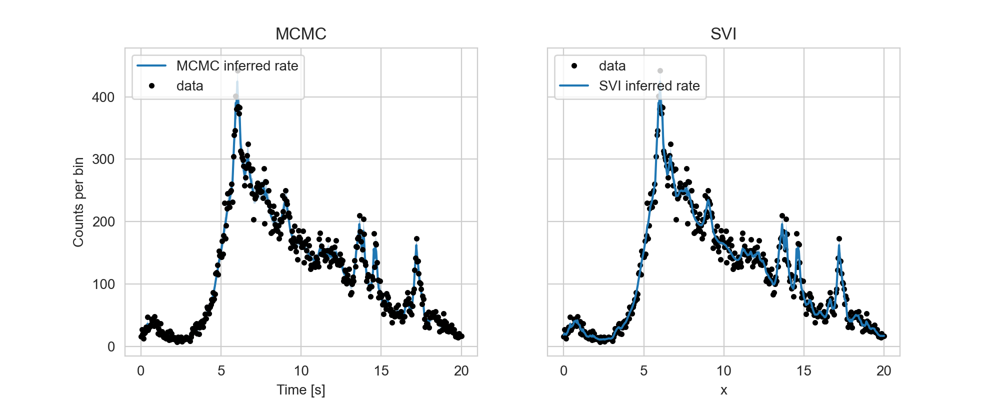

Text(0.5, 1.0, 'SVI')

In [92]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

mcmc_flux = jnp.exp(mcmc_samples["log_rate"] + 3.0).T + mcmc_mean.T
q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.plot(lcsample.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")
#plt.plot(x, , "--", color="C1", label="true rate")
ax1.plot(lcsample.time, lcsample.counts, ".k", label="data")
ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")



#mu = results.params["auto_z_0_loc"][6:] #results.params["log_rate_auto_loc"]
#sigma = results.params["auto_z_0_scale"][6:] # results.params["log_rate_auto_scale"]

svi_flux = jnp.exp(svi_samples["log_rate"]+ 3.0).T + svi_mean.T
q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

ax2.plot(lcsample.time, lcsample.counts, ".k", label="data")


ax2.plot(lcsample.time, q[2], color="C0", label="SVI inferred rate")
ax2.fill_between(lcsample.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
ax2.fill_between(lcsample.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")


ax2.legend(loc=2)
ax2.set_xlabel("x")
ax2.set_title("SVI")


What do the posterior distributions look like?

First MCMC:

<IPython.core.display.Javascript object>


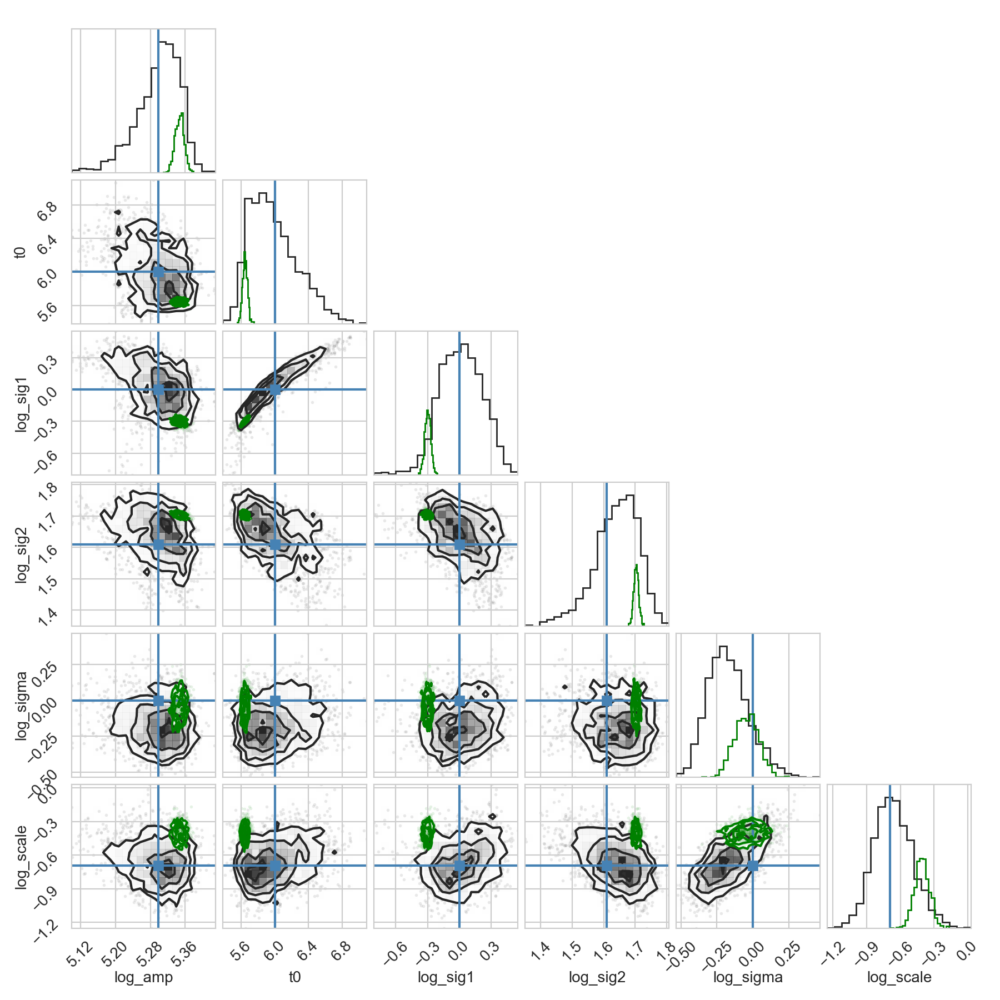

In [91]:
var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale"]
true_params = {"log_sigma": jnp.log(true_sigma), "log_scale": jnp.log(true_scale),
               "log_amp" : jnp.log(skew_amp), "t0": skew_t0, "log_sig1": jnp.log(skew_sig1),
               "log_sig2": jnp.log(skew_sig2)}

samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(9, 9))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, fig=fig, color="green");

Can we draw examples from the posterior? What do they look like?

In [118]:
def sample_lc_from_posterior(params, time, key=None, exp_const=3):
    
    var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale"]

    mean_params = params[:4]
    kernel_params = jnp.exp(params[4:])
    
    kernel = kernels.quasisep.Matern32(scale=kernel_params[1], sigma=kernel_params[0])

    # GP without the mean function to generate random process
    gp = GaussianProcess(kernel, time, diag=0.01)
    
    if key is None:
        key = random.PRNGKey(np.random.randint(0,1e7))
    else:
        key = random.PRNGKey(key)
        
    gp_sample = gp.sample(key)

    # calculate background mean
    true_const = 10.0
    bkg = jnp.zeros_like(time) + true_const


    mean_val = skewgaussian(time, mean_params)


    # calculate flux
    exp_gp = jnp.exp(gp_sample + exp_const) # exponentiated GP
    flux = exp_gp + mean_val #+ bkg # add mean function and bkg
    counts = np.random.poisson(flux)

    lcsim = Lightcurve(time, counts, dt=time[1]-time[0], skip_checks=True)
    pssim = Powerspectrum(lcsim, norm="frac")
    return lcsim, pssim

In [119]:
nsamples = mcmc_samples["t0"].shape[0]
nsim = 50
idx = np.random.choice(np.arange(0, nsamples, 1, dtype=int), size=nsim)

lcsim_all, pssim_all = [], []
for i in idx:
    lcsim, pssim = sample_lc_from_posterior(mcmc_samples_pars[i, :], lcsample.time)
    lcsim_all.append(lcsim)
    pssim_all.append(pssim)

<IPython.core.display.Javascript object>


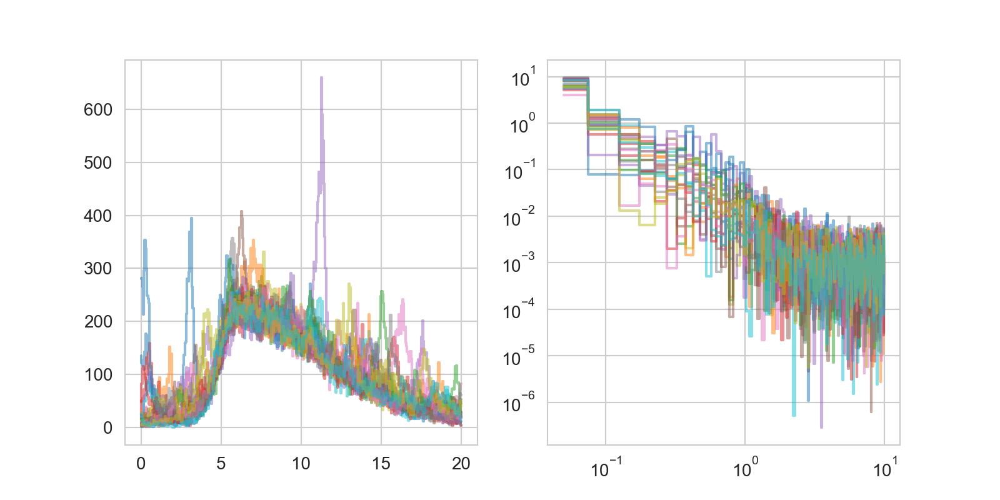

In [123]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))

for lcsim, pssim in zip(lcsim_all, pssim_all):
    ax1.plot(lcsim.time, lcsim.counts, ds="steps-mid", alpha=0.5)
    ax2.loglog(pssim.freq, pssim.power, ds="steps-mid", alpha=0.5)

Okay, that looks pretty realistic, but there are a lot of big spikes that don't always look super realistic. There are certainly examples of bursts where there seems to be a relationship between the overall brightness and the amplitude of the variability (e.g. GRB 230307A). Let's implement that:

### Multiplicative mean model

I think we're ready for a multiplicative mean model! Let's do it! Let's also add a constant background just for good measure:

INFO[2024-03-28 18:49:49,358]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-28 18:49:49,360]: Checking if light curve is sorted.
INFO[2024-03-28 18:49:49,361]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


<IPython.core.display.Javascript object>


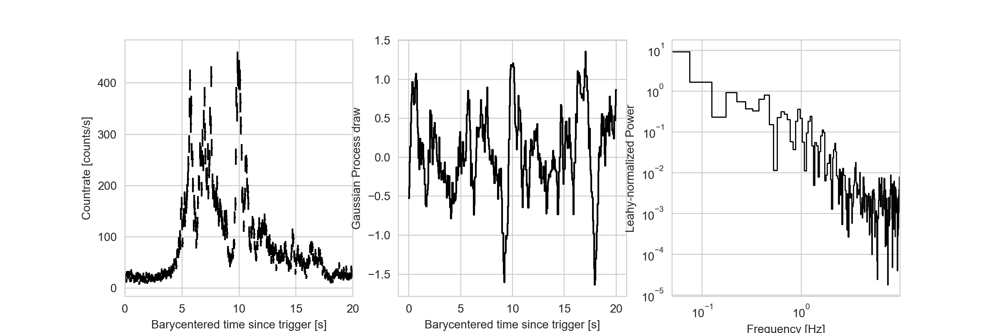

Text(0, 0.5, 'Leahy-normalized Power')

In [171]:
# Make a time array
tseg = 20.0
time = np.linspace(0, tseg, int(tseg/0.05))


# make the kernel and set up GP
true_log_sigma = jnp.log(0.5)
true_log_scale = jnp.log(0.3)

kernel_params_true = {"log_sigma": true_log_sigma,
                      "log_scale": true_log_scale}

kernel = kernels.quasisep.Matern32(
    scale=jnp.exp(true_log_scale), sigma=jnp.exp(true_log_sigma)
)

gp = GaussianProcess(kernel, time, diag=0.01)

key = random.PRNGKey(500)
gp_sample = gp.sample(key)

###########################

# set up the mean function
true_log_amp = jnp.log(100)
true_t0 = 6.0
true_log_sig1 = jnp.log(1.0)
true_log_sig2 = jnp.log(5.0)

mean_params_true = [true_log_amp, true_t0, true_log_sig1, true_log_sig2]
mean_val = skewgaussian(time, mean_params_true)

# parameter to set the absolute level of the GP mean
true_log_const = jnp.log(0.5)

# background flux
true_log_bkg = jnp.log(20.0)


# combine light curve
gp_flux = jnp.exp(gp_sample + jnp.exp(true_log_const))
flux = mean_val * gp_flux + jnp.exp(true_log_bkg)
counts = np.random.poisson(flux)

lcsample = Lightcurve(time, counts)
pssample = Powerspectrum(lcsample, norm="frac")

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4))

ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
#ax1.plot(time, mean_val, lw=2, color="green")

ax1.set_xlim(lcsample.time[0], lcsample.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.plot(lcsample.time, gp_sample, color="black", ds="steps-mid")
ax2.set_xlabel("Barycentered time since trigger [s]")
ax2.set_ylabel("Gaussian Process draw")

ax3.loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
#ax2.loglog(pssample.freq, ps_carma, lw=1, color="purple")
ax3.set_xlim(pssample.freq[0], pssample.freq[-1])
ax3.set_xlabel("Frequency [Hz]")
ax3.set_ylabel("Leahy-normalized Power")



Okay, let's see if I can sample this model. I have an additional parameter, which is the fraction of the overall rise and fall that attenuates the noise process. This also has the slight effect that the model flux can go negative, but let's worry about that later:

In [172]:
def mult_model(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process and 
    a skew-normal mean function. The combined process includes the 
    addition of the mean function, and the DRW * frac * mean_function, 
    where frac is between 0.0 and 0.5. We also include a constant, 
    additive background to simulate sky background and use a 
    Poisson likelihood.

    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # mean parameters
    log_amp = numpyro.sample('log_amp', dist.Uniform(3, 8))
    t0 = numpyro.sample("t0", dist.Uniform(2, 10))
    log_sig1 = numpyro.sample("log_sig1", dist.Uniform(-1, 1.5))
    log_sig2 = numpyro.sample("log_sig2", dist.Uniform(0, 3))

    mean_params = [log_amp, t0, log_sig1, log_sig2]
    
    mean_val = skewgaussian(x, mean_params)
    

    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-2, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-6, 4))

    # constant offset from zero for GP
    log_const = numpyro.sample("log_const", dist.Uniform(-6, jnp.log(3.0)))
    
    # constant background flux
    log_bkg = numpyro.sample("log_bkg", dist.Uniform(-4, jnp.log(200)))
    
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Matern32(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    gp_flux = jnp.exp(log_rate + jnp.exp(log_const))
    flux =  mean_val * gp_flux + jnp.exp(log_bkg)

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


In [173]:
## MCMC 
nuts_kernel = numpyro.infer.NUTS(mult_model, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=3000,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(55683)
mcmc.run(rng_key, lcsample.time, y=lcsample.counts)
mcmc_samples = mcmc.get_samples()


sample: 100%|█| 4000/4000 [07:47<00:00,  8.55it/s, 1023 steps of size 5.86e-03. 
sample: 100%|█| 4000/4000 [09:32<00:00,  6.99it/s, 1023 steps of size 5.23e-03. 


<IPython.core.display.Javascript object>


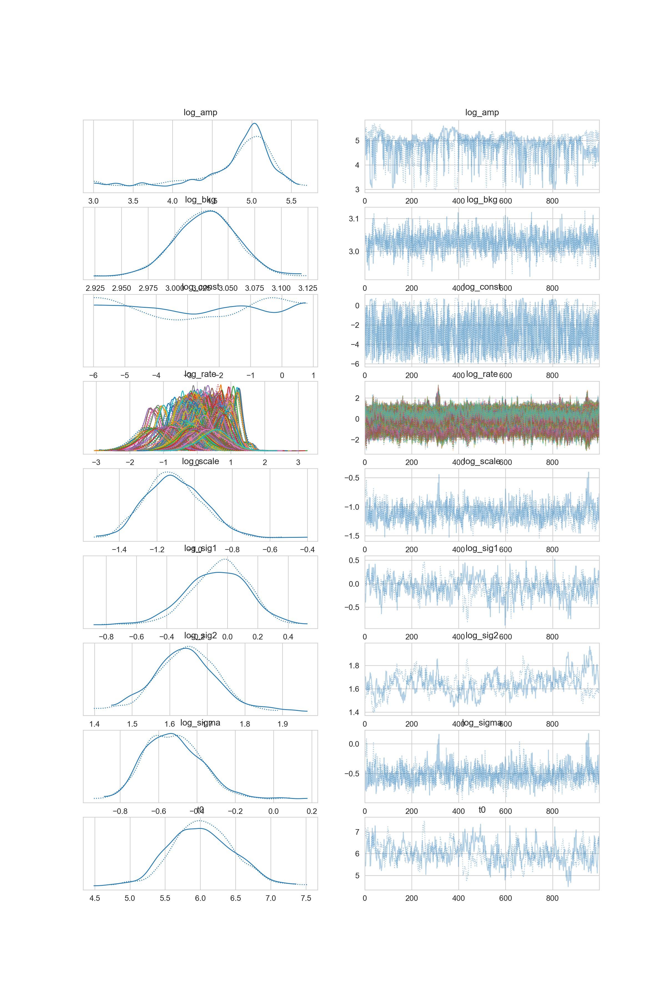

In [174]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

Now SVI:

In [175]:
#init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
#               "log_sigma": -4.0, "log_scale":0.5, "frac": 0.1, "log_const": 2.0}

# without frac
init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
               "log_sigma": -4.0, "log_scale":0.5, "log_const": jnp.log(0.5), "log_bkg": jnp.log(20.0)}

In [178]:
# SVI

nsteps = 2000
optim = numpyro.optim.Adam(0.002)
#guide = autoguide.AutoDAIS(mult_model, init_loc_fn=init_to_value(values=init_values))
guide = autoguide.AutoMultivariateNormal(mult_model)
svi = numpyro.infer.SVI(mult_model, guide, optim, numpyro.infer.Trace_ELBO(10))
results = svi.run(jax.random.PRNGKey(53333), nsteps, lcsample.time, y=lcsample.counts, progress_bar=True)

svi_samples = guide.sample_posterior(key, results.params, sample_shape=(1000,))

100%|█| 2000/2000 [00:32<00:00, 61.44it/s, init loss: 42111.2049, avg. loss [190


SVI Loss Plot:

<IPython.core.display.Javascript object>


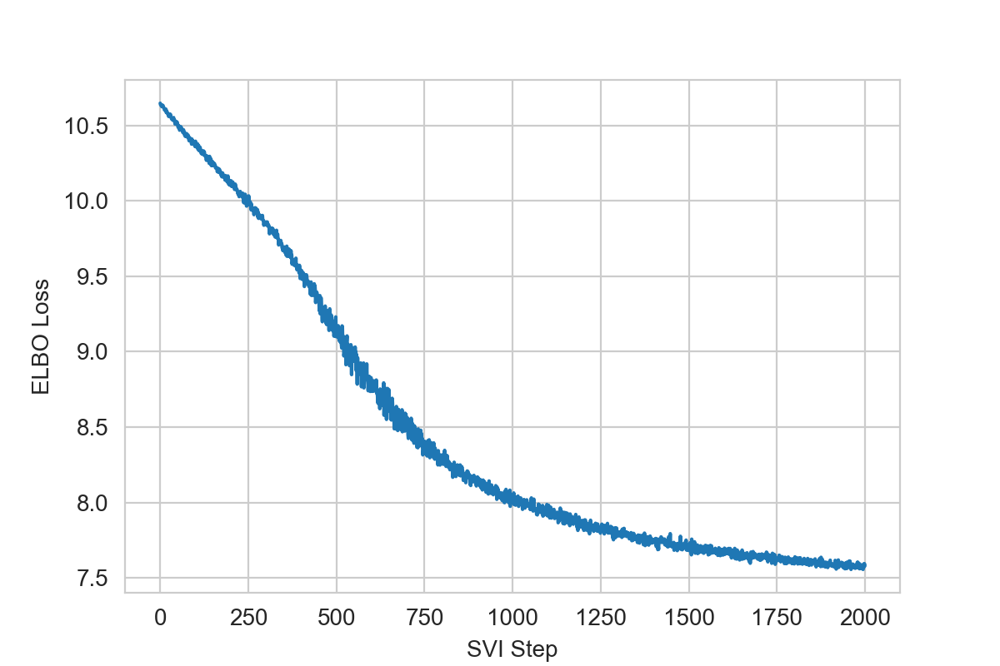

Text(0, 0.5, 'ELBO Loss')

In [179]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")

What do the results look like?

In [180]:
mcmc_skew_params = np.array([mcmc_samples["log_amp"], mcmc_samples["t0"], 
                    mcmc_samples["log_sig1"], mcmc_samples["log_sig2"]]).T

mcmc_mean = []
for p in mcmc_skew_params:
    mcmc_mean.append(skewgaussian(lcsample.time,p))

mcmc_mean = np.array(mcmc_mean)



svi_skew_params = np.array([svi_samples["log_amp"], svi_samples["t0"], 
                  svi_samples["log_sig1"], svi_samples["log_sig2"]]).T

svi_mean = []
for p in svi_skew_params:
    svi_mean.append(skewgaussian(lcsample.time, p))

svi_mean = np.array(svi_mean)

<IPython.core.display.Javascript object>


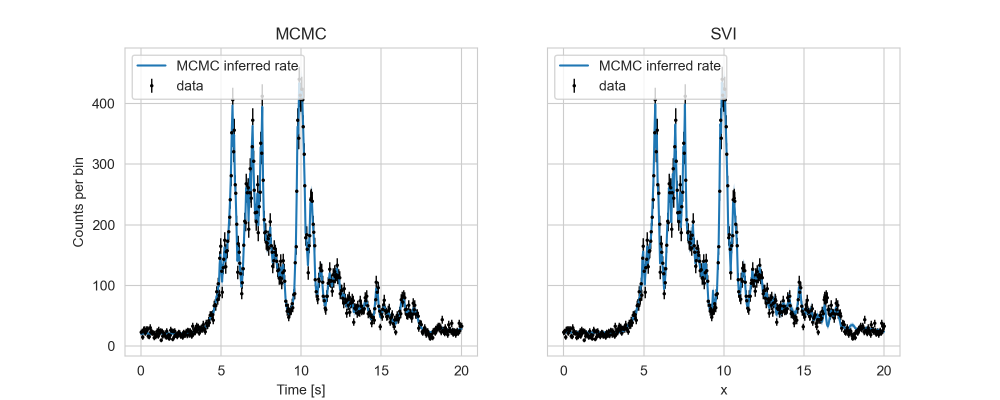

Text(0.5, 1.0, 'SVI')

In [182]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)


    
mcmc_flux = mcmc_mean.T * jnp.exp(mcmc_samples["log_rate"].T + \
                                  jnp.exp(mcmc_samples["log_const"])) + \
            jnp.exp(mcmc_samples["log_bkg"])

q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(lcsample.counts),
             fmt="o", markersize=1.5, lw=1, color="black", label="data")

ax1.plot(lcsample.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lcsample.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lcsample.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")

ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")



svi_flux = svi_mean.T * jnp.exp(svi_samples["log_rate"].T + \
                                jnp.exp(svi_samples["log_const"])) + \
           jnp.exp(svi_samples["log_bkg"])
q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

ax2.errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(lcsample.counts),
             fmt="o", markersize=1.5, lw=1, color="black", label="data")

ax2.plot(lcsample.time, q_svi[2] , color="C0", label="MCMC inferred rate")
ax2.fill_between(lcsample.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
ax2.fill_between(lcsample.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")


ax2.legend(loc=2)
ax2.set_xlabel("x")
ax2.set_title("SVI")


What do the posterior distributions look like?

In [154]:
true_log_sigma

Array(-0.69314718, dtype=float64, weak_type=True)

<IPython.core.display.Javascript object>


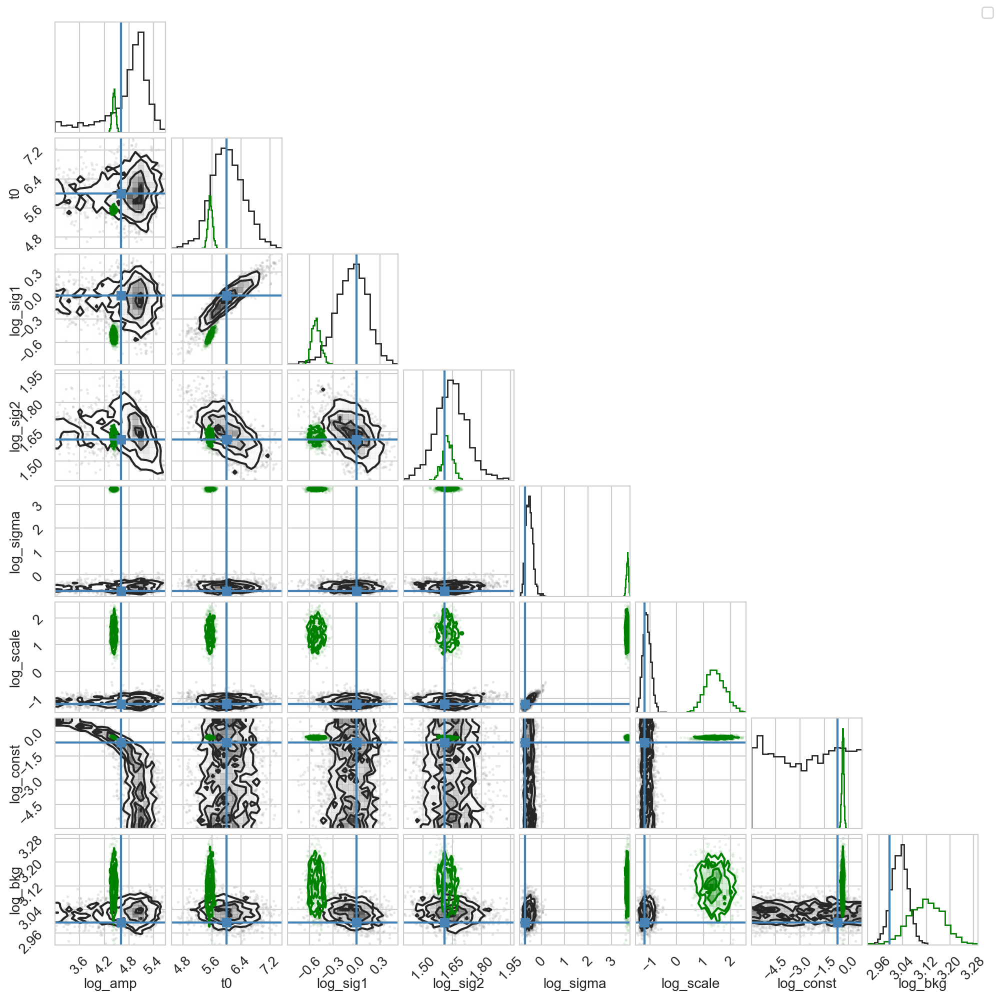

WARNING[2024-03-28 19:20:00,341]: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [183]:
#var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale", 
#             "log_const", "frac"]

#true_params = {"log_sigma": true_log_sigma, "log_scale": true_log_scale,
#               "log_amp" : true_log_amp, "t0": true_t0, "log_sig1": true_log_sig1,
#               "log_sig2": true_log_sig2, "frac": true_frac, "log_const": true_log_const}

var_names = ["log_amp", "t0", "log_sig1", "log_sig2", 
             "log_sigma", "log_scale", "log_const", "log_bkg"]

true_params = {"log_sigma": true_log_sigma, "log_scale": true_log_scale,
               "log_amp" : true_log_amp, "t0": true_t0, "log_sig1": true_log_sig1,
               "log_sig2": true_log_sig2, "log_const": true_log_const, "log_bkg": true_log_bkg}



samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(10, 10))
corner.corner(mcmc_samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="MCMC");
corner.corner(samples_pars, truths=true_params_list, labels=var_names, fig=fig, titles="SVI", color="green");

fig.legend()

Well, that works great! Let's draw some samples:

In [184]:
def sample_lc_from_mult_posterior(params, time, key=None, exp_const=3):
    
    var_names = ["log_amp", "t0", "log_sig1", "log_sig2", 
                 "log_sigma", "log_scale", "log_const", "log_bkg"]

    mean_params = params[:4]
    kernel_params = jnp.exp(params[4:6])
    log_const = params[6]
    log_bkg = params[7]
    
    kernel = kernels.quasisep.Matern32(scale=kernel_params[1], sigma=kernel_params[0])

    # GP without the mean function to generate random process
    gp = GaussianProcess(kernel, time, diag=0.01)
    
    if key is None:
        key = random.PRNGKey(np.random.randint(0,1e7))
    else:
        key = random.PRNGKey(key)
        
    gp_sample = gp.sample(key)

    mean_val = skewgaussian(time, mean_params)

    # calculate flux
    gp_flux = jnp.exp(gp_sample + jnp.exp(log_const))
    flux = mean_val * gp_flux + jnp.exp(log_bkg)
    counts = np.random.poisson(flux)

    lcsim = Lightcurve(time, counts, dt=time[1]-time[0], skip_checks=True)
    pssim = Powerspectrum(lcsim, norm="frac")
    return lcsim, pssim

<IPython.core.display.Javascript object>


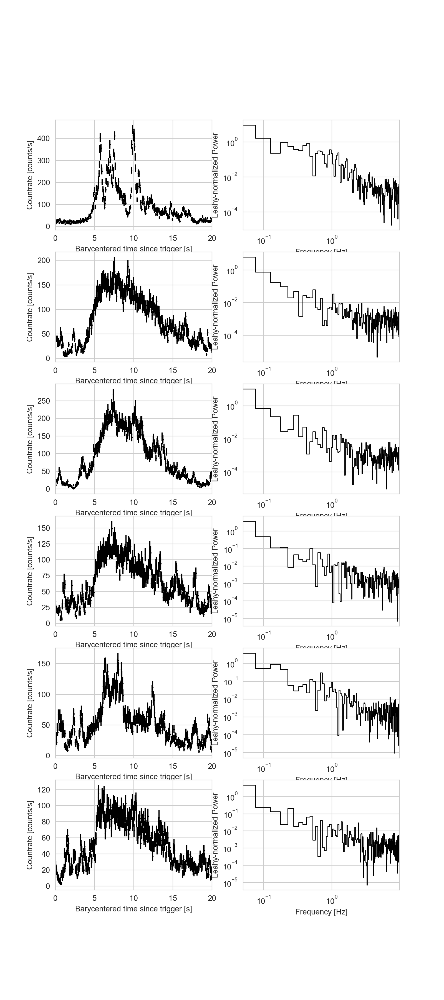

In [192]:
nsamples = mcmc_samples["t0"].shape[0]
nsim = 5
idx = np.random.choice(np.arange(0, nsamples, 1, dtype=int), size=nsim)

lcsim_all, pssim_all = [], []
for i in idx:
    lcsim, pssim = sample_lc_from_posterior(mcmc_samples_pars[i, :], lcsample.time)
    lcsim_all.append(lcsim)
    pssim_all.append(pssim)
    
fig, axes = plt.subplots(nsim+1, 2, figsize=(8,(nsim+1)*3))

axes = np.hstack(axes)

axes[0].errorbar(lcsample.time, lcsample.counts, yerr=np.sqrt(np.abs(lcsample.counts)), 
             fmt="o", markersize=1, color="black")
#ax1.plot(time, mean_val, lw=2, color="green")

axes[0].set_xlim(lcsample.time[0], lcsample.time[-1])
axes[0].set_xlabel("Barycentered time since trigger [s]")
axes[0].set_ylabel("Countrate [counts/s]")

axes[1].loglog(pssample.freq, pssample.power, ds="steps-mid", lw=1, color="black")
axes[1].set_xlim(pssample.freq[0], pssample.freq[-1])
axes[1].set_xlabel("Frequency [Hz]")
axes[1].set_ylabel("Leahy-normalized Power")


for i, (lcsim, pssim) in enumerate(zip(lcsim_all, pssim_all)):
    axes[(i+1)*2].errorbar(lcsim.time, lcsim.counts, yerr=np.sqrt(np.abs(lcsim.counts)), 
                 fmt="o", markersize=1, color="black")
    #ax1.plot(time, mean_val, lw=2, color="green")

    axes[(i+1)*2].set_xlim(lcsample.time[0], lcsample.time[-1])
    axes[(i+1)*2].set_xlabel("Barycentered time since trigger [s]")
    axes[(i+1)*2].set_ylabel("Countrate [counts/s]")

    axes[(i+1)*2+1].loglog(pssim.freq, pssim.power, ds="steps-mid", lw=1, color="black")
    axes[(i+1)*2+1].set_xlim(pssample.freq[0], pssample.freq[-1])
    axes[(i+1)*2+1].set_xlabel("Frequency [Hz]")
    axes[(i+1)*2+1].set_ylabel("Leahy-normalized Power")


## Application to GRB 230307A

Let's now apply this model to the GRB, then simulate data from the MAP model and see if I can recover the parameters.

## Running this on the real data

To load the data, we'll have to read them from an IDL .sav file, which will return a dictionary with the relevant columns as keywords and the values in arrays:

In [48]:
#datadir = "/Users/danielahuppenkothen/work/repositories/grb230307a_qposearch/data/"
datadir = "/Users/daniela/work/data/grb230307A/"

data = scipy.io.readsav(datadir+"acs_lc_bary.sav")
data

{'barytime': array([-6.87185967, -6.82185948, -6.77185976, ..., 98.02814186,
        98.07813728, 98.12814033], dtype='>f8'),
 'counts': array([4502., 4570., 4576., ..., 4516., 4444., 4514.], dtype='>f4')}

Let's turn this into a `stingray.Lightcurve` object. On the way, we will also restrict it to the 0-60s time interval, and will take out the background:

In [82]:
barytime = np.array(data["barytime"], dtype=float)
counts = np.array(data["counts"], dtype=float)


# store in Lightcurve object, then truncate to 0-60s interval:
lc = Lightcurve(barytime, counts)
#minind = lc.time.searchsorted(0.0)
#maxind = lc.time.searchsorted(60.0)
#lc = lc.truncate(start=minind, stop=maxind, method="index")

# calculate periodogram for comparison:
ps = Powerspectrum(lc, norm="leahy")

INFO[2024-03-20 14:04:19,343]: Checking if light curve is well behaved. This can take time, so if you are sure it is already sorted, specify skip_checks=True at light curve creation.
INFO[2024-03-20 14:04:19,345]: Checking if light curve is sorted.
INFO[2024-03-20 14:04:19,347]: Computing the bin time ``dt``. This can take time. If you know the bin time, please specify it at light curve creation


Let's plot the light curve and periodogram:

<IPython.core.display.Javascript object>


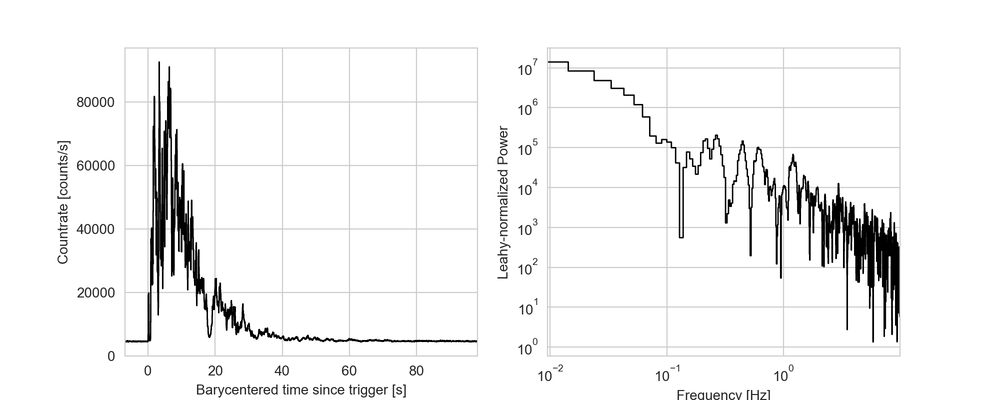

Text(0, 0.5, 'Leahy-normalized Power')

In [83]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.plot(lc.time, lc.counts, lw=1, color="black", ds="steps-mid")
ax1.set_xlim(lc.time[0], lc.time[-1])
ax1.set_xlabel("Barycentered time since trigger [s]")
ax1.set_ylabel("Countrate [counts/s]")

ax2.loglog(ps.freq, ps.power, ds="steps-mid", lw=1, color="black")
ax2.set_xlim(ps.freq[0], ps.freq[-1])
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Leahy-normalized Power")

In [84]:
t0_init = 6.0
log_amp_init = np.log(np.max(lc.counts)/2.)
log_sig1_init = np.log(3.0)
log_sig2_init = np.log(20.0)
log_const_init = np.log(np.mean(lc.counts[-200:]))
frac_init = 0.1

log_sigma_init = 0.0
log_scale_init = -2.0

In [85]:
def mult_model_grb(x, y=None):
    """
    A model that defines a Damped Random Walk Gaussian Process and 
    a skew-normal mean function. The combined process includes the 
    addition of the mean function, and the DRW * frac * mean_function, 
    where frac is between 0.0 and 0.5. We also include a constant, 
    additive background to simulate sky background and use a 
    Poisson likelihood.

    Parameters
    ----------
    x : jax.numpy.array
        The x-coordinate of the data (usually here time)
        
    y : jax.numpy.array
        The y-coordinate of the data (usually here photon counts)
    
    """
 
    # mean parameters
    log_amp = numpyro.sample('log_amp', dist.Uniform(4, 12))
    t0 = numpyro.sample("t0", dist.Uniform(0.0, 15))
    log_sig1 = numpyro.sample("log_sig1", dist.Uniform(-2, 2.3))
    log_sig2 = numpyro.sample("log_sig2", dist.Uniform(2.0, 5.0))
    log_const = numpyro.sample("log_const", dist.Normal(8.5, 1.0))

    mean_params = [log_amp, t0, log_sig1, log_sig2]
    
    mean_val = skewgaussian(x, mean_params)
    

    # The parameters of the GP model    
    log_scale = numpyro.sample("log_scale", dist.Uniform(-10, 10))
    log_sigma = numpyro.sample("log_sigma", dist.Uniform(-10, 10))
    frac = numpyro.sample("frac", dist.Uniform(0.0, 1.0))
    
    #print(alpha1)
    # Set up the kernel and GP objects
    
    kernel = kernels.quasisep.Exp(
        scale=jnp.exp(log_scale), sigma=jnp.exp(log_sigma)
    )

    gp = GaussianProcess(kernel, x, diag=0.01)

    # This parameter has shape (num_data,) and it encodes our beliefs about
    # the process rate in each bin
    log_rate = numpyro.sample("log_rate", gp.numpyro_dist())
    
    flux =  mean_val + frac * mean_val * log_rate + jnp.exp(log_const)

    # Finally, our observation model is Poisson
    numpyro.sample("obs", dist.Poisson(flux), obs=y)


In [86]:
## MCMC 
nuts_kernel = numpyro.infer.NUTS(mult_model_grb, target_accept_prob=0.9)
mcmc = numpyro.infer.MCMC(
    nuts_kernel,
    num_warmup=2000,
    num_samples=1000,
    num_chains=4,
    progress_bar=True,
)
rng_key = jax.random.PRNGKey(53993)
mcmc.run(rng_key, lc.time, y=lc.counts)
mcmc_samples = mcmc.get_samples()


sample: 100%|█| 3000/3000 [13:49<00:00,  3.62it/s, 1023 steps of size 1.06e-03
sample: 100%|█| 3000/3000 [13:28<00:00,  3.71it/s, 1023 steps of size 1.28e-03
sample: 100%|█| 3000/3000 [13:59<00:00,  3.57it/s, 1023 steps of size 2.99e-03
sample: 100%|█| 3000/3000 [08:37<00:00,  5.80it/s, 511 steps of size 7.15e-03.


<IPython.core.display.Javascript object>


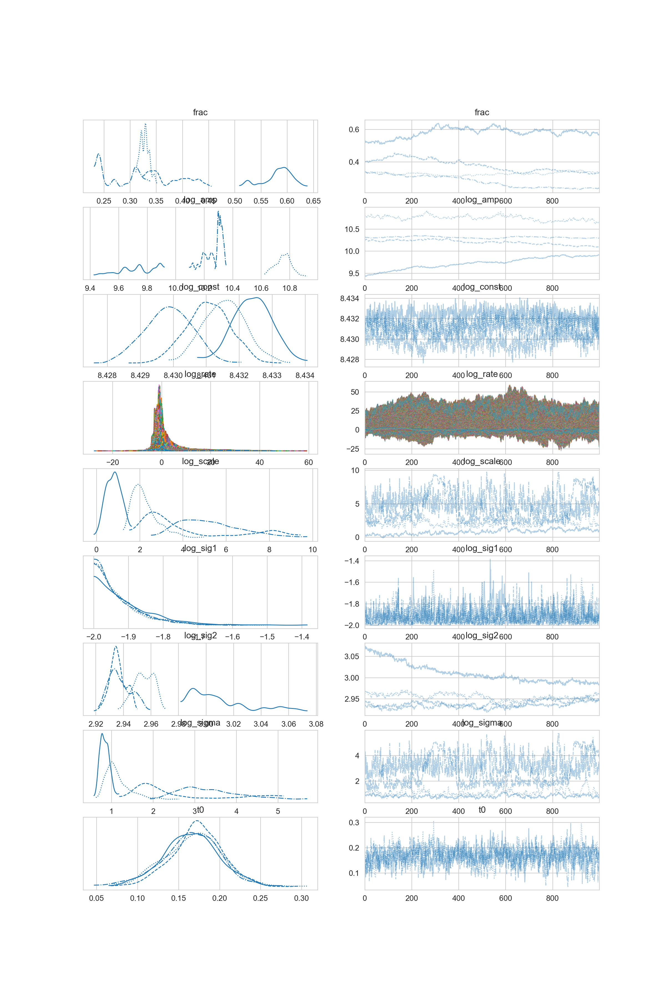

In [87]:
mcmc_data = az.from_numpyro(mcmc)
az.plot_trace(mcmc_data, compact=True);

What about SVI?

In [55]:
t0_init = 6.0
log_amp_init = np.log(np.max(lc.counts)/2.)
log_sig1_init = np.log(3.0)
log_sig2_init = np.log(20.0)
log_const_init = np.log(np.mean(lc.counts[-200:]))
frac_init = 0.1

log_sigma_init = 0.0
log_scale_init = -2.0

In [56]:
init_values = {"log_amp": 5.0, "t0":5.0, "log_sig1":0.0, "log_sig2": 2.0,
               "log_sigma": -4.0, "log_scale":0.5, "frac": 0.1, "log_const": 2.0}
# SVI
nsteps = 35000
key = 54974

optim = numpyro.optim.Adam(0.0005)
guide = autoguide.AutoDAIS(mult_model, init_loc_fn=init_to_value(values=init_values))
svi = numpyro.infer.SVI(mult_model_grb, guide, optim, numpyro.infer.Trace_ELBO(10))
results = svi.run(jax.random.PRNGKey(key), nsteps, lc.time, y=lc.counts, progress_bar=True)


100%|█| 35000/35000 [1:22:33<00:00,  7.07it/s, init loss: nan, avg. loss [3325


In [62]:
rng_key = jax.random.PRNGKey(53983)

svi_samples = guide.sample_posterior(rng_key, results.params, sample_shape=(1000,))

In [64]:
results.losses

Array([nan, nan, nan, ..., nan, nan, nan], dtype=float64)

<IPython.core.display.Javascript object>


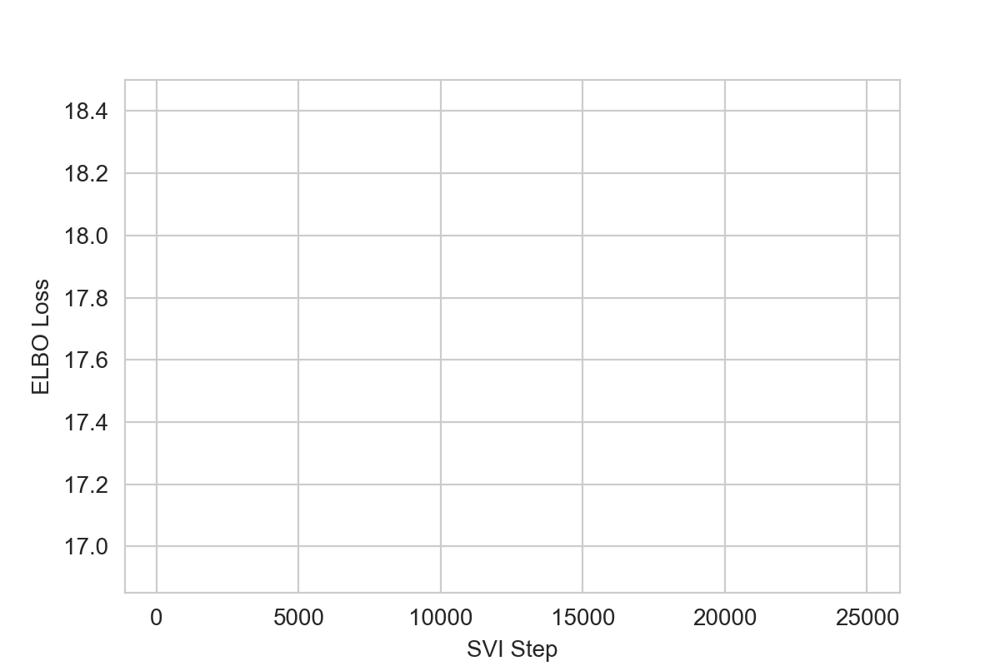

Text(0, 0.5, 'ELBO Loss')

In [63]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.plot(np.arange(nsteps), np.log(results.losses))
ax.set_xlabel("SVI Step")
ax.set_ylabel("ELBO Loss")

In [88]:
mcmc_skew_params = np.array([mcmc_samples["log_amp"], mcmc_samples["t0"], 
                    mcmc_samples["log_sig1"], mcmc_samples["log_sig2"]]).T

mcmc_mean = []
for p in mcmc_skew_params:
    mcmc_mean.append(skewgaussian(lc.time,p))

mcmc_mean = np.array(mcmc_mean)



#svi_skew_params = np.array([svi_samples["log_amp"], svi_samples["t0"], 
#                  svi_samples["log_sig1"], svi_samples["log_sig2"]]).T

#svi_mean = []
#for p in svi_skew_params:
#    svi_mean.append(skewgaussian(lc.time, p))

#svi_mean = np.array(svi_mean)

<IPython.core.display.Javascript object>


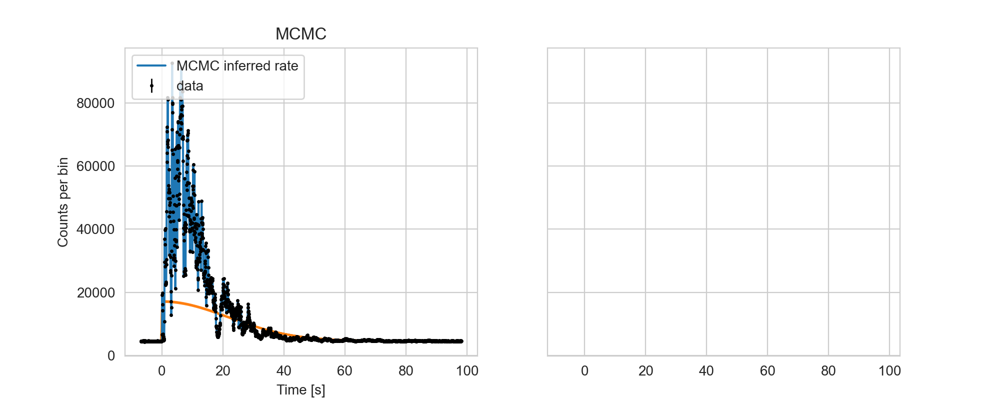

Text(0.5, 1.0, 'MCMC')

In [92]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), sharey=True, sharex=True)

mcmc_flux = mcmc_mean.T \
            + mcmc_samples["frac"] * mcmc_mean.T * mcmc_samples["log_rate"].T \
            + jnp.exp(mcmc_samples["log_const"])

q = np.percentile(mcmc_flux.T, [5, 25, 50, 75, 95], axis=0)
ax1.errorbar(lc.time, lc.counts, yerr=np.sqrt(lc.counts),
             fmt="o", markersize=1.5, lw=1, color="black", label="data")


for i in range(10):
    ax1.plot(lc.time, mcmc_mean[i,:] + jnp.exp(mcmc_samples["log_const"][i]), color="C1", alpha=0.4)

ax1.plot(lc.time, q[2] , color="C0", label="MCMC inferred rate")
ax1.fill_between(lc.time, q[0], q[-1], alpha=0.3, lw=0, color="C0")
ax1.fill_between(lc.time, q[1], q[-2], alpha=0.3, lw=0, color="C0")

ax1.legend(loc=2)
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Counts per bin")
ax1.set_title("MCMC")



#mu = results.params["auto_z_0_loc"][8:] #results.params["log_rate_auto_loc"]
#sigma = results.params["auto_z_0_scale"][8:] # results.params["log_rate_auto_scale"]
#svi_median_flux = svi_mean + svi_mean * frac_median * mu + jnp.exp(log_const_median)

#svi_flux = svi_mean.T \
#            + svi_mean.T * svi_samples["log_rate"].T \
#            + jnp.exp(svi_samples["log_const"])

#q_svi = np.percentile(svi_flux.T, [5, 25, 50, 75, 95], axis=0)

#ax2.errorbar(lc.time, lc.counts, yerr=np.sqrt(lc.counts),
#             fmt="o", markersize=1.5, lw=1, color="black", label="data")

#ax2.plot(lc.time, q_svi[2] , color="C0", label="MCMC inferred rate")
#ax2.fill_between(lc.time, q_svi[0], q_svi[-1], alpha=0.3, lw=0, color="C0")
#ax2.fill_between(lc.time, q_svi[1], q_svi[-2], alpha=0.3, lw=0, color="C0")


#ax2.legend(loc=2)
#ax2.set_xlabel("x")
#ax2.set_title("SVI")


What do the posterior distributions look like?

<IPython.core.display.Javascript object>


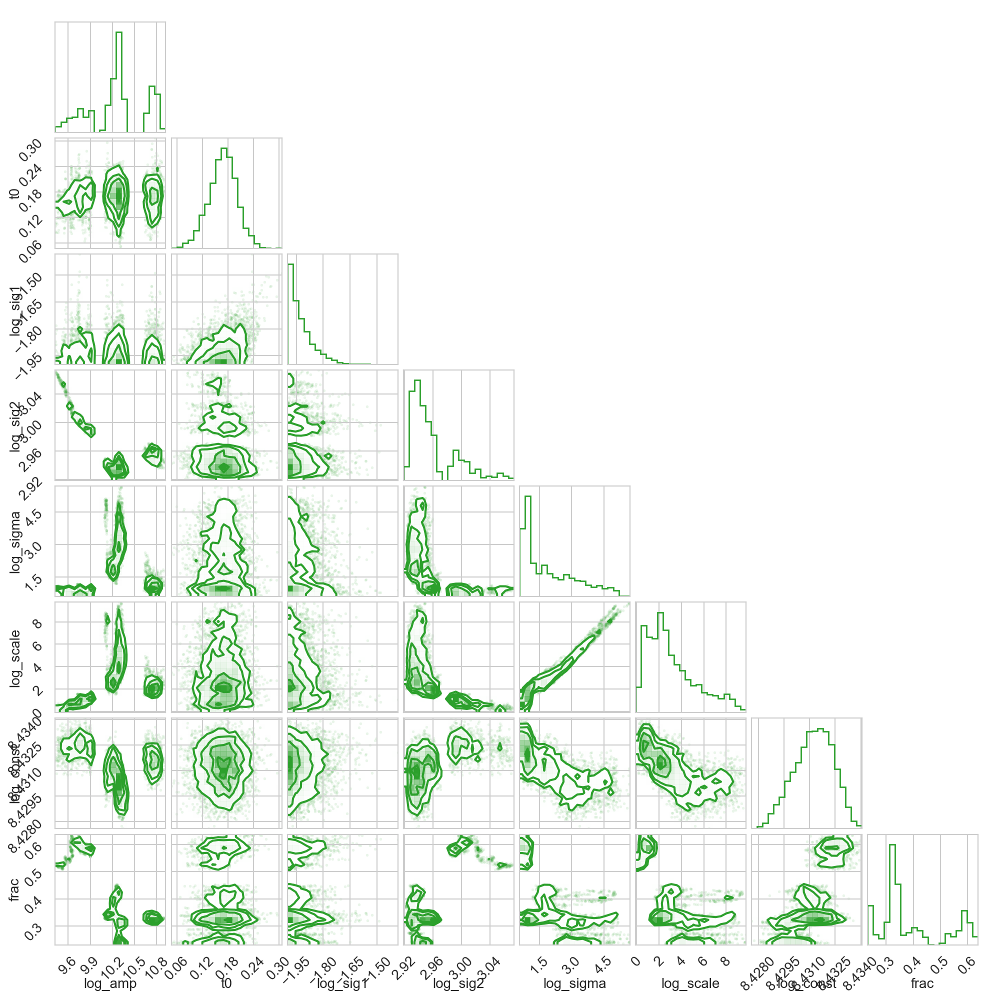

In [93]:
var_names = ["log_amp", "t0", "log_sig1", "log_sig2", "log_sigma", "log_scale", 
             "log_const", "frac"]

#true_params = {"log_sigma": true_log_sigma, "log_scale": true_log_scale,
#               "log_amp" : true_log_amp, "t0": true_t0, "log_sig1": true_log_sig1,
#               "log_sig2": true_log_sig2, "frac": true_frac, "log_const": true_log_const}

#samples_pars = np.array([svi_samples[vn] for vn in var_names]).T
mcmc_samples_pars = np.array([mcmc_samples[vn] for vn in var_names]).T
#true_params_list = np.array([true_params[vn] for vn in var_names])


fig = plt.figure(figsize=(10, 10))
corner.corner(mcmc_samples_pars, labels=var_names, fig=fig, titles="MCMC", color="C2");
#corner.corner(samples_pars, labels=var_names, fig=fig, titles="SVI", color="C1");